In [1]:
import numpy as np
import pandas as pd

from environment import EpisodicEnv
from generator import Generator
from propagator import Propagator
from simulator import Simulator
import torch


In [2]:
df_words_similarities = pd.read_csv('data/words_similarities.csv', index_col=0)
df_words_similarities[df_words_similarities < 0] = 0
df_words_similarities[df_words_similarities > 1] = 1

df_locations_similarities = pd.read_csv('data/locations_similarities.csv', index_col=0)

df_env_states = pd.read_csv('data/environment_states.csv', index_col=0)
df_env_novel_states = pd.read_csv('data/environment_novel_states.csv', index_col=0)
# Select 5 rows
df_env_novel_states = df_env_novel_states.sample(5)

# Scale time to be between 0 and 1
df_env_states['time'] = df_env_states['time'] / df_env_states['time'].max()

# Mutate locations column to have integers
locations = df_env_states['location'].unique()
locations_dict = {location: i for i, location in enumerate(locations)}
inv_locations_dict = {i: location for i, location in enumerate(locations)}

df_env_states['location'] = df_env_states['location'].map(locations_dict)


In [3]:
from reinforce import PolicyNetwork
from torch import optim

env = EpisodicEnv(states=df_env_states, semantic_similarities=df_words_similarities,
                  k=1, m=1, n=1)

env.set_reward(df_env_novel_states)


In [4]:
discount_factor = 0.99

num_episodes = 200

num_states = 2_000

In [5]:
from tqdm.notebook import tqdm


#Init network
network = PolicyNetwork(env.n_states, env.n_states)

#Init optimizer
optimizer = optim.Adam(network.parameters(),  lr=1e-2)

#Track scores
scores = []

#iterate through episodes
for episode in tqdm(range(num_episodes)):

    #reset environment, initiable variables
    rewards = []
    log_probs = []
    score = 0

    #generate episode
    policy = network.forward(torch.eye(env.n_states))
    env.transition_matrix = policy

    generator = Generator(env)
    propagator = Propagator(generator)
    simulator = Simulator(propagator)
    states, log_probs, rewards = simulator.sample_states(num_states=num_states)

    scores.append(np.array(rewards).sum())
    #Calculate Gt (cumulative discounted rewards)
    discounted_rewards = []

    #track cumulative reward
    total_r = 0

    #iterate rewards from Gt to G0
    for r in reversed(rewards):

        #Base case: G(T) = r(T)
        #Recursive: G(t) = r(t) + G(t+1)^DISCOUNT
        total_r = r + total_r ** discount_factor

        #append to discounted rewards
        discounted_rewards.append(total_r)

    #reverse discounted rewards
    rewards = torch.tensor(discounted_rewards)
    rewards = torch.flip(rewards, [0])
    # rewards = (rewards - rewards.mean()) / (rewards.std() + 1e-9)

    # adjusting policy parameters with gradient ascent
    loss = []
    for r, lp in zip(rewards, log_probs):
        #we add a negative sign since network will perform gradient descent and we are doing gradient ascent with REINFORCE
        loss.append(-r * lp)

    # Backpropagation
    optimizer.zero_grad()
    sum(loss).backward()
    optimizer.step()


  0%|          | 0/200 [00:00<?, ?it/s]

State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State distribution must be non-negative, cropping to 0
State dist

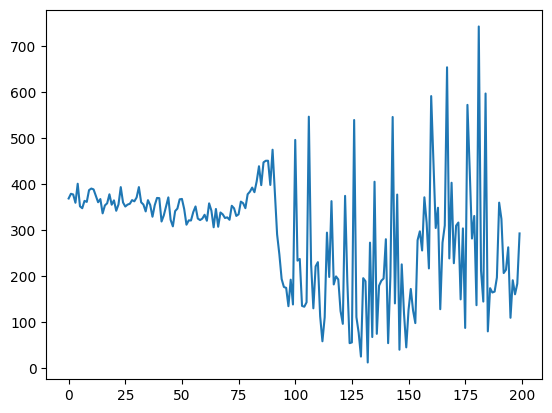

In [6]:
# plot score

import matplotlib.pyplot as plt

plt.plot(scores)
plt.show()


In [7]:
policy = network.forward(torch.eye(env.n_states))

policy = policy.detach().numpy()

# Get the location of max at each row
policy

array([[5.4359105e-31, 5.4359105e-31, 5.4359105e-31, ..., 2.3960462e-25,
        5.4359105e-31, 5.4359105e-31],
       [2.6415406e-24, 2.6415406e-24, 2.6415406e-24, ..., 4.2291244e-20,
        2.6415406e-24, 2.6415406e-24],
       [2.4902054e-22, 2.4902054e-22, 2.4902054e-22, ..., 3.4835421e-17,
        2.4902054e-22, 2.4902054e-22],
       ...,
       [4.8836654e-29, 4.8836654e-29, 4.8836654e-29, ..., 5.8213688e-23,
        1.3559955e-28, 4.8836654e-29],
       [8.6499989e-21, 8.6499989e-21, 8.6499989e-21, ..., 1.7750248e-15,
        4.5030818e-20, 8.6499989e-21],
       [2.2036524e-21, 2.2036524e-21, 2.2036524e-21, ..., 4.2587738e-17,
        2.2036524e-21, 2.2036524e-21]], dtype=float32)

In [8]:
np.argmax(env.rewards)

tensor(31)

In [9]:
env.rewards[24]

tensor(0.0104)